In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches

In [167]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('umap.csv', index_col=0).values

In [168]:
adata.obs = adata.obs.join(pd.read_csv('tonsil_cell_types.csv', index_col=0))

In [180]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)

In [169]:
BaseTravLR.impute_clusterwise(
    adata, 
    annot='cell_type_2', 
    layer='normalized_count', 
    layer_added='imputed_count'
)   

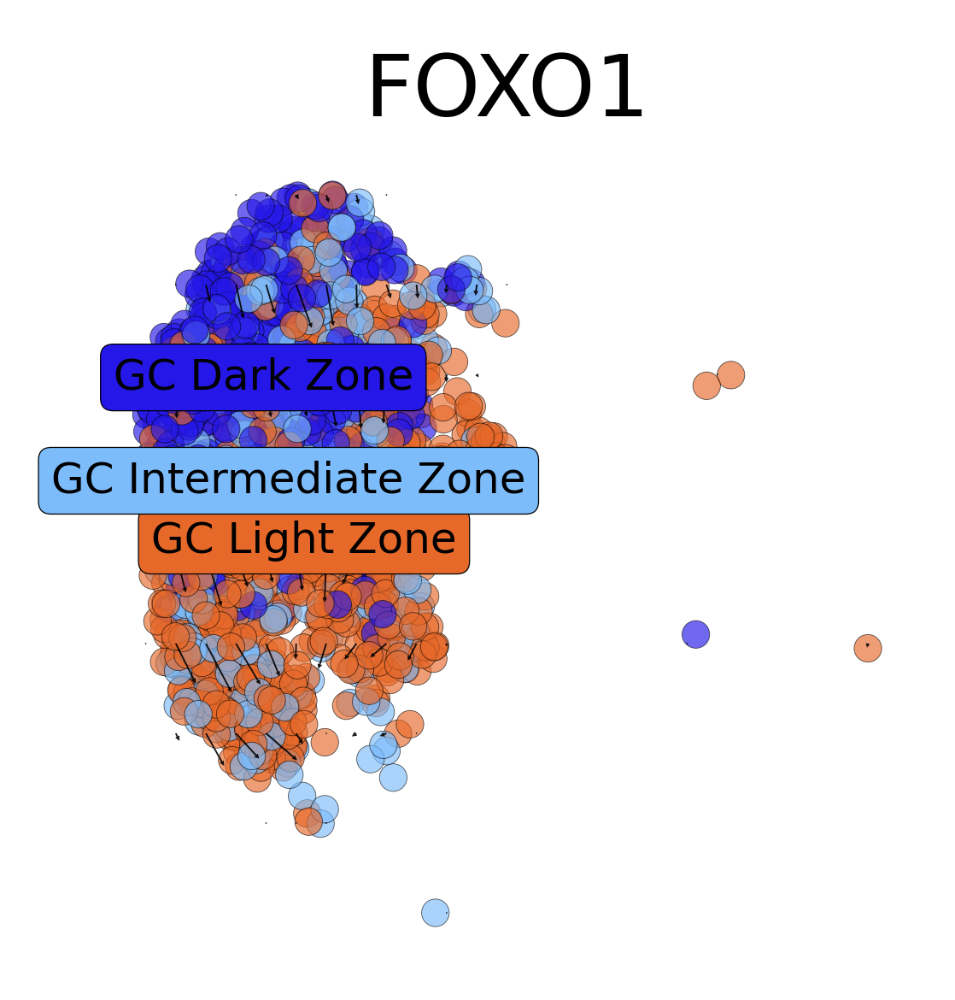

In [173]:
%matplotlib inline

color_dict = {
    'T_CD4': "#f721b7",
    'GC Dark Zone': "#2517e8",
    'GC Light Zone': "#e7692a",
    'GC Intermediate Zone':  "#7dbcfb",
    'plasma': "#61c17c",
    'B_naive': "#308f0e", 
    'B_memory': "#beb637",
    
    'Naive CD4 T': "#f721b7",
    'Treg': "#ecc91d",
    'T memory': "#49f12f",
    'Th1': "#c43cf2",
    'Th2': "#2c43f1",
    'T_CD8': "#dd3652",
    'T_follicular_helper': "#e28723",
}


perturb_target = 'FOXO1'

perturbed_df = pd.read_parquet(
    f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet')

# perturbed_df.loc[~adata.obs.cell_type_2.isin(['Th2']), :] = adata.to_df(
#     layer='imputed_count').loc[~adata.obs.cell_type_2.isin(['Th2']), :]

# chart = Cartography(adata[
#     adata.obs.cell_type_2.isin(['T_follicular_helper', 'Th2', 'Th1', 'Treg', 'Naive CD4 T'])], 
# color_dict)

chart = Cartography(adata[
    adata.obs.cell_type_2.isin(['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone'])], 
color_dict)

grid_points, vector_field, P = chart.plot_umap_quiver(
    perturb_target=perturb_target,
    grid_scale=1,
    vector_scale=0.7,
    n_neighbors=200,
    figsize=(2, 2), 
    hue='cell_type_2',
    alpha=0.65,
    perturbed_df=perturbed_df,
    scatter_size=15,
    remove_null=True,
    legend_on_loc=True,
    legend_fontsize=6,
)

plt.show()

In [174]:
adata = chart.adata

In [175]:
from spaceoracle.plotting.cartography import get_grid_layout

In [176]:
from sklearn.neighbors import KNeighborsRegressor

def _knn_regression(x, y, x_new, y_new, value, n_knn=30):

    data = np.stack([x, y], axis=1)

    model = KNeighborsRegressor(n_neighbors=n_knn)
    model.fit(data, value)

    data_new = np.stack([x_new, y_new], axis=1)

    return model.predict(data_new)

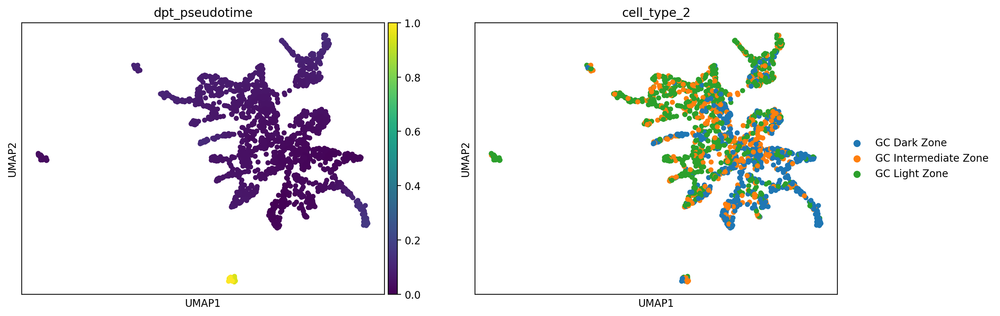

In [306]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_type_2'] == 'GC Dark Zone')[1]
sc.tl.diffmap(adata)
sc.tl.dpt(adata, n_dcs=10, n_branchings=0)
sc.pl.umap(adata, color=['dpt_pseudotime', 'cell_type_2'], size=100)

In [277]:
sc.pp.neighbors(adata, n_neighbors=100, use_rep="X_diffmap")
sc.tl.umap(adata)

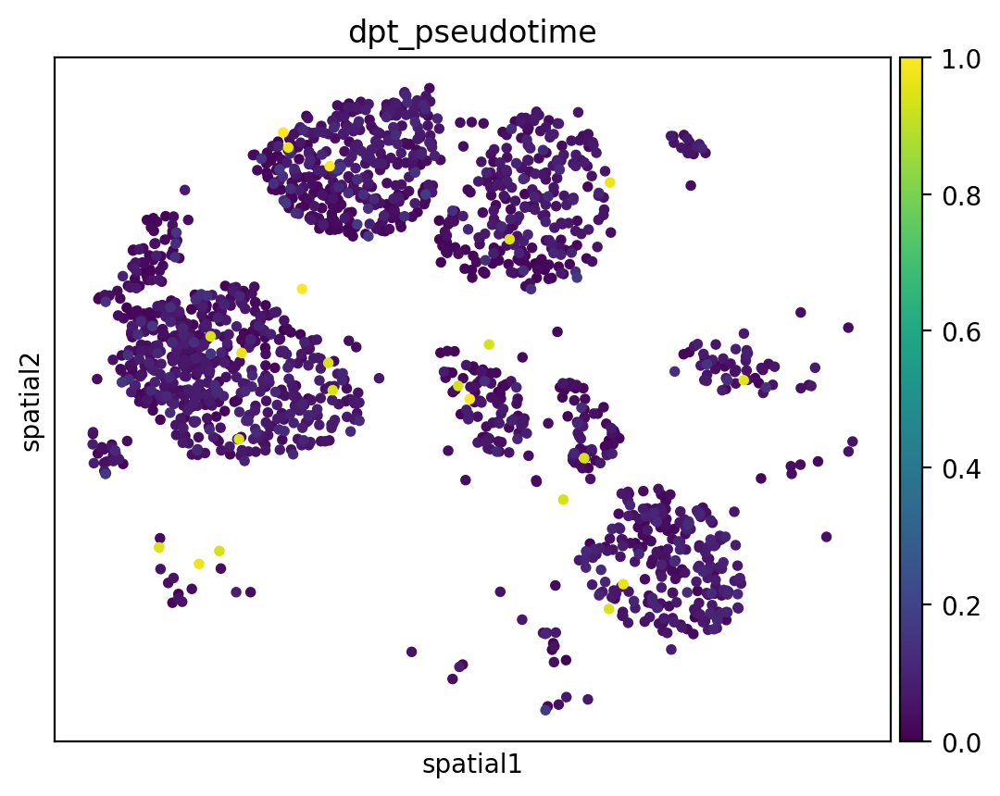

In [307]:
sc.pl.embedding(adata, color=['dpt_pseudotime'], basis='spatial')

In [279]:
from celloracle.applications.differentiation_flow import get_gradient, normalize_gradient
import random
from spaceoracle.virtual_tissue import VirtualTissue

In [280]:
embedding = adata.obsm['X_umap']
x, y = embedding[:, 0], embedding[:, 1]
x_new, y_new = grid_points[:, 0], grid_points[:, 1]
value = adata.obs.dpt_pseudotime.values
# value = tonsil.load_betadata(gene='IL21')['beta_IL7$IL7R'].values
pseudotime_on_grid = _knn_regression(x, y, x_new, y_new, value, n_knn=30)
gradient = get_gradient(value_on_grid=pseudotime_on_grid)
gradient = normalize_gradient(gradient, method="sqrt")
l2_norm = np.linalg.norm(gradient, ord=2, axis=1)
scale_factor = 1 / l2_norm.mean()
ref_flow = gradient

In [285]:
x.shape, y.shape, adata.obs.cell_type_2.values.shape

((1760,), (1760,), (1760,))

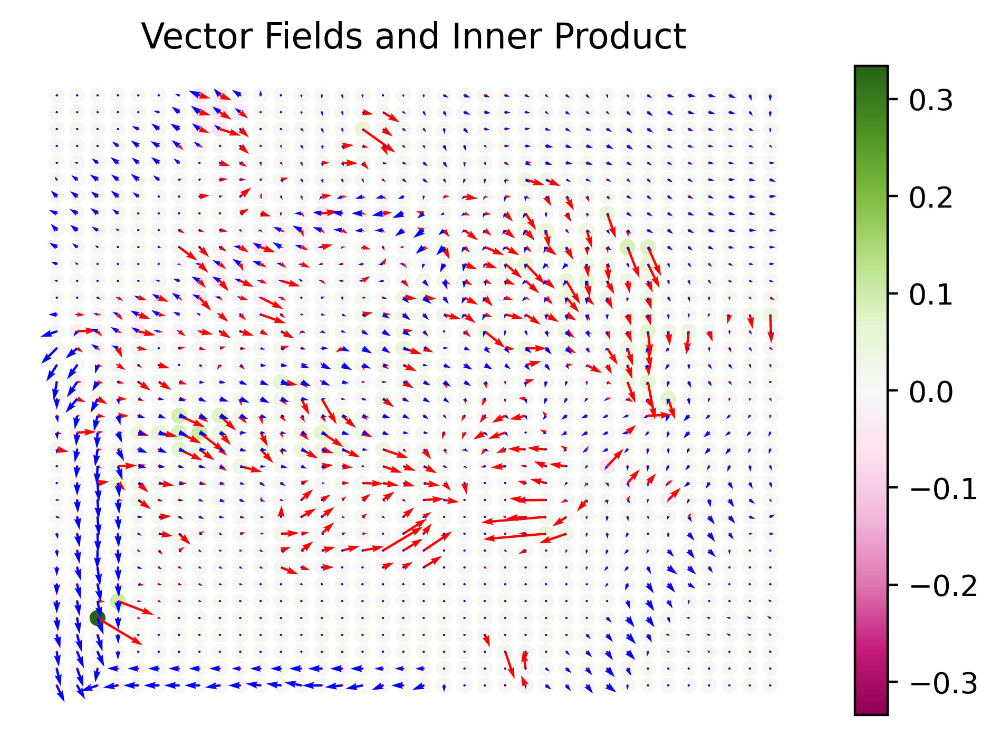

In [299]:
inner_product = np.sum(vector_field * ref_flow, axis=1)
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
vmax = np.abs(inner_product).max()
scatter = ax.scatter(grid_points[:,0], grid_points[:,1], 
                    c=inner_product, cmap='PiYG', s=20,
                    vmin=-vmax, vmax=vmax)

ax.quiver(grid_points[:,0], grid_points[:,1],
          vector_field[:,0], vector_field[:,1],
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='red', width=0.003)

ax.quiver(grid_points[:,0], grid_points[:,1],
          ref_flow[:, 0], ref_flow[:, 1], 
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='blue', width=0.003)

ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_title('Vector Fields and Inner Product')
ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
plt.colorbar(scatter)

plt.show()

In [301]:
pseudotime_on_grid.shape, grid_points.shape

((1520,), (1520, 2))

In [317]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil'
)

In [211]:
# adata = adata[adata.obs.query(
#     'cell_type_2.isin(["T_follicular_helper", "Treg", "Naive CD4 T", "Th1", "Th2"])').index]

# adata = adata[adata.obs.query(
#     'cell_type_2.isin(["GC Light Zone", "GC Dark Zone", "GC Intermediate Zone"])').index]

In [10]:
# tonsil.compute_ko_impact(force_recompute=True)

In [192]:
# %matplotlib inline
# tonsil.plot_radar(genes=[['IL7', 'IL4',  'IL6ST', 'GZMA'], ['IL21', 'PAX5', 'GATA3', 'FOXP3']], 
#     show_for=['B_germinal_center', 'B_naive', 'T_CD4', 
#     'B_memory', 'T_follicular_helper', 'T_CD8'])

In [395]:
adata.obs['cell_type_major'] = adata.obs.cell_type_2.replace(
    {
        'GC Dark Zone': 'Germinal Center B cells', 
        'GC Light Zone': 'Germinal Center B cells', 
        'GC Intermediate Zone': 'Germinal Center B cells', 
        'plasma': 'Plasma cells', 
        'B_naive': 'B cells', 
        'B_memory': 'B cells', 
        'B_germinal_center': 'Germinal Center B cells', 
        'Naive CD4 T': 'T cells', 
        'Treg': 'T cells', 
        'T memory': 'T cells', 
        'Th1': 'T cells', 
        'Th2': 'T cells', 
        'T_CD8': 'T cells', 
        'T_follicular_helper': 'T cells', 
        'mDC': 'Dendritic cells', 
        'FDC': 'Dendritic cells', 
        'myeloid': 'Myeloid cells', 
        'NK': 'NK cells', 
        'pDC': 'Dendritic cells', 
        'T_double_neg': 'T cells'
    }
)

In [396]:
color_dict = {
    'GC Dark Zone': "#f14e13",
    'GC Light Zone': "#0feca9",
    'GC Intermediate Zone':  "#4492e0",
    'plasma': "#61c17c",
    'B_naive': "#308f0e", 
    'B_memory': "#beb637",
    'B_germinal_center': "#8995cf",
    'Naive CD4 T': "#f721b7",
    'Treg': "#ecc91d",
    'T memory': "#49f12f",
    'Th1': "#c43cf2",
    'Th2': "#5e6ff3",
    'T_CD8': "#dd3652",
    'T_CD4': "#2b07f6",
    'T_follicular_helper': "#e28723",
    'mDC': "#a5a29e", 
    'FDC': "#a5a29e", 
    'myeloid': "#a5a29e", 
    'NK': "#a5a29e", 
    'pDC': "#a5a29e", 
    'T_double_neg': "#a5a29e",
    'Germinal Center B cells': "#6295cd",
    'Plasma cells': "#58a862",
    'T cells': "#cc5343",
    'B cells': "#9865c8",
    'Dendritic cells': "#9da13c",
    'Myeloid cells': "#f3c009",
    'NK cells': "#a36e29",
}

In [397]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil',
    color_dict=color_dict
)

In [398]:
from spaceoracle.models.parallel_estimators import create_spatial_features

spf = create_spatial_features(
    x=adata.obsm['spatial'][:, 0], 
    y=adata.obsm['spatial'][:, 1], 
    celltypes=adata.obs.cell_type_2, 
    obs_index=adata.obs_names
)

cell_groups = {
    'GC B Cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone'],
    'B cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone', 'B_naive', 'B_memory'],
    # 'T cells': ['Naive CD4 T', 'T_follicular_helper', 'Th2', 'Th1', 'Treg'],
    'T cells': ['T_follicular_helper'],
    
}

In [380]:
from scipy.stats import pearsonr

from spaceoracle.visionary import Visionary
from spaceoracle.plotting.cartography import xy_from_adata
from spaceoracle.plotting.cartography import Cartography


### Set up visionary

In [399]:
# atmp = adata[~adata.obs.index.isin(adata.obs.iloc[[2250, 2593, 3255, 5281]].index)]
# atmp = adata[pd.read_csv('GC_selection.csv', index_col=0).index]
atmp = adata
tonsil.init_cartography(atmp, 
    # restrict_to=[
    #     'Naive CD4 T',
    #     'T_follicular_helper', 
    #     'Th2', 
    #     'Th1', 
    #     'Treg',
    #     'T_CD8',
        
    #     'T memory',
         
    #     'GC Light Zone',
    #     'GC Dark Zone',
    #     'GC Intermediate Zone',
    #     'B_naive',
    #     'B_memory',
    #     'plasma'
        
    # ]
)

In [400]:
chart = Cartography(adata[
    adata.obs.cell_type_2.isin(['T_follicular_helper', 'Th2', 'Th1', 'Treg', 'Naive CD4 T'])], 
color_dict)

# chart = Cartography(adata, color_dict)

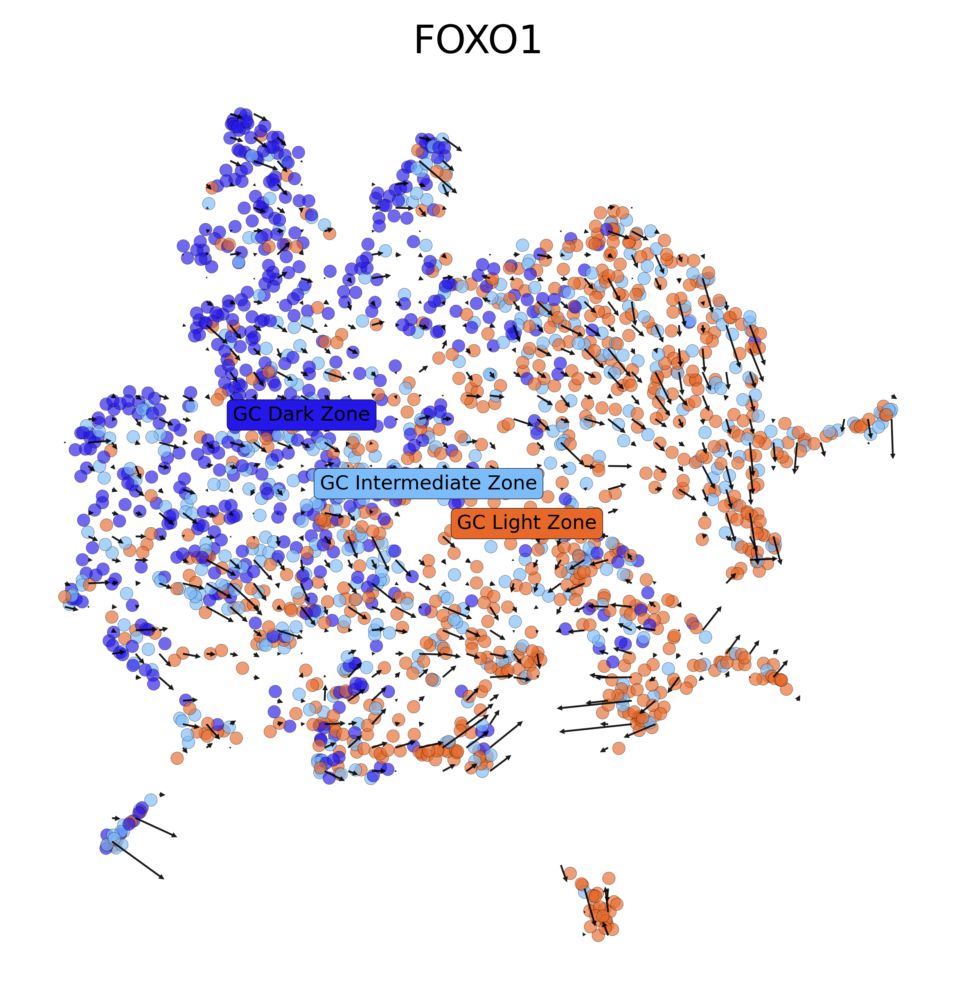

In [265]:
perturb_target = 'FOXO1'

perturbed_df = pd.read_parquet(
    f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet')

# perturbed_df = pd.read_csv('celloracle_FOXO1_KO.csv', index_col=0)


# perturbed_df.loc[~adata.obs.cell_type_2.isin(['Th2']), :] = adata.to_df(
#     layer='imputed_count').loc[~adata.obs.cell_type_2.isin(['Th2']), :]

grid_points, vector_field, P = chart.plot_umap_quiver(
    perturb_target=perturb_target,
    grid_scale=1,
    vector_scale=0.8,
    n_neighbors=100,
    figsize=(5, 5), 
    hue='cell_type_2',
    alpha=0.65,
    perturbed_df=perturbed_df,
    scatter_size=15,
    remove_null=True,
    legend_on_loc=True,
    legend_fontsize=6,
)

plt.show()

In [205]:
test_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')
ref_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad')
ref_models_dir = '/ix/djishnu/shared/djishnu_kor11/lasso_runs/mouse_kidney_13'

ref_adata, test_adata

(AnnData object with n_obs × n_vars = 8509 × 3058
     obs: 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain', 'cell_type', 'cell_type_int'
     uns: 'cell_thresholds', 'cell_type_colors', 'neighbors', 'pca', 'received_ligands', 'received_ligands_tfl', 'umap'
     obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
     varm: 'PCs'
     layers: 'imputed_count', 'normalized_count', 'raw_count'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 10000 × 3058
     obs: 'ct3', 'cell_type'
     uns: 'cell_type_colors', 'log1p'
     obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
     layers: 'corrected_count', 'imputed_count', 'normalized_count', 'raw_count')

In [111]:
harmony_df = pd.read_csv('banksy_subsampled_harmony.csv', index_col=0)

ref_adata.obsm['X_harmony'] = harmony_df.loc[ref_adata.obs.index + '-0', :].values
test_adata.obsm['X_harmony'] = harmony_df.loc[test_adata.obs.index + '-1', :].values

ref_adata.obsm['X_umap'] = ref_adata.obsm['X_harmony'][:, :2]
test_adata.obsm['X_umap'] = test_adata.obsm['X_harmony'][:, :2]

harmony_df.index = [val.rsplit('-', 1)[0] for val in harmony_df.index]


In [7]:
# matching = pd.read_csv('matching_slat.csv', index_col=0)
matching = pd.read_csv('matching_slat_banksy_subsampled.csv', index_col=0)
matching.head(3)

,reference_cell
ID_167606,CGTTAGAAGTTCCTGA-13
ID_103875,GACTTCCGTCAGGAGT-13
ID_276156,GAGAAATAGAAATTGC-13


In [8]:
# banksy_df = pd.read_csv('banksy_subsampled.csv', index_col=0)
# banksy_df.head(3)

In [9]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)


renata = Visionary(
    ref_adata = ref_adata,
    test_adata = test_adata,
    ref_json_path = f'{ref_models_dir}/run_params.json',
    # subsample=1,
    prematching=matching,
    matching_annot='cell_type'
)

### Perturb

In [10]:
target = 'Mif' 
gex = 0

In [11]:
renata.perturb(target, n_propagation=4, save_layer=True)
gex_df = renata.adata.to_df(layer=f'{target}_4n_{gex}x')
gex_df.to_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/mouse_kidney_visiumHD_subsampled_banksy/{target}_4n_{gex}x.parquet')

In [12]:
adata = renata.adata
gf = renata

In [13]:
gex_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/mouse_kidney_visiumHD_subsampled_banksy/{target}_4n_{gex}x.parquet')
adata.layers[target] = gex_df.loc[adata.obs.index, adata.var.index].values
adata.to_df(layer=f'{target}')[target].max() # make sure it's been knocked out

0.0

In [14]:
np.allclose(gex_df.values, adata.to_df(layer='imputed_count').values)

False

In [15]:
adata

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'ct3', 'cell_type', 'cell_type_int', 'reference_cell'
    uns: 'cell_type_colors', 'log1p', 'cell_thresholds', 'received_ligands', 'received_ligands_tfl'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'corrected_count', 'imputed_count', 'normalized_count', 'raw_count', 'Mif_4n_0x', 'Mif'

In [16]:
colors =[
    "#6f6ec7",
    "#59ba58",
    "#a45dcf",
    "#a2b343",
    "#c857a7",
    "#4e884c",
    "#d44064",
    "#50bca8",
    "#c65d3d",
    "#6b96d2",
    "#d49a46",
    "#bd6c8a",
    "#817531"
]
# color_dict = {i: color for i, color in zip(adata.obs['banksy_cluster'].unique(), colors)}

In [17]:
adata.obs['ct3'] = adata.obs['reference_cell'].map(ref_adata.obs['ct3'])
adata.obs['cell_type'] = adata.obs['reference_cell'].map(ref_adata.obs['cell_type'])

In [18]:
target_gene = 'Mif'
# chart = Cartography(adata, color_dict)

### Transitions

In [19]:
# adata.obs = adata.obs.drop(columns=['x', 'y'])

In [20]:
# umap_coords = pd.read_csv('banksy_subsampled.csv', index_col=0)
# umap_coords = umap_coords.loc[adata.obs.index, ['x_umap', 'y_umap']].values

# adata.obsm['X_umap'] = umap_coords

In [21]:
# sample = 'mouse_kidney_visiumHD_subsampled_banksy'

# kotarget = 'Mif'
# ax = chart.plot_umap_quiver(
#     perturb_target=kotarget,
#     grid_scale=1,
#     vector_scale=0.5,
#     figsize=(5, 5), 
#     # hue='ref_cell_type',
#     hue='banksy_cluster',
#     alpha=0.5,
#     scatter_size=10,
#     # betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}/not_batch_corrected',
#     betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}',
#     legend_on_loc=False,
# )
# ax.legend(
#     bbox_to_anchor=(0.5, 0.0),
#     loc='upper center', ncol=3, 
#     frameon=False, markerscale=1.5,
#     fontsize=6
# )

# # Add cluster labels on top of points
# for cluster in adata.obs['banksy_cluster'].unique():
#     mask = adata.obs['banksy_cluster'] == cluster
#     x = adata.obsm['X_umap'][mask, 0].mean()
#     y = adata.obsm['X_umap'][mask, 1].mean()
#     ax.text(x, y, str(cluster),
#             horizontalalignment='center',
#             verticalalignment='center',
#             fontsize=8,
#             bbox=dict(facecolor='gray', alpha=0.2, edgecolor='none'))

# plt.title(f'{kotarget} KO')
# plt.show()

In [113]:
harmony_df

,X_harmony_0,X_harmony_1,X_harmony_2,X_harmony_3,X_harmony_4,X_harmony_5,X_harmony_6,X_harmony_7,X_harmony_8,X_harmony_9,...,X_harmony_40,X_harmony_41,X_harmony_42,X_harmony_43,X_harmony_44,X_harmony_45,X_harmony_46,X_harmony_47,X_harmony_48,X_harmony_49
AAACCCAAGAGGGTCT-13,-5.614694,-2.222966,-1.469418,-1.135539,3.216255,2.163784,4.119853,0.585989,2.607331,-6.043539,...,0.998110,1.760033,-0.638885,-1.886422,1.325358,-2.458529,-1.845989,2.944102,-0.561417,0.822430
AAACCCAAGCGTGTTT-13,-2.095995,2.604097,1.587521,0.085519,2.307760,3.358408,-0.434702,1.086719,-1.863670,0.746490,...,3.525425,2.941402,2.334248,-3.125967,2.213160,-4.101131,-3.286118,-1.930954,-3.969869,-3.062475
AAACCCAAGGTGATAT-13,-4.961589,0.682688,-0.293644,-2.553435,1.973020,3.907009,5.722576,-0.938509,6.686820,-8.820220,...,-1.236080,0.030628,-0.254142,-1.202405,-1.167152,-1.762414,-0.567035,-1.525350,-1.368725,0.827051
AAACCCAAGTCTAACC-13,2.775041,6.953980,3.887084,1.290243,0.725446,6.774096,-0.738917,-0.326803,0.318631,-0.633679,...,-0.094902,2.838872,1.889749,-0.758963,0.740091,-2.551890,-1.126740,0.425453,-0.281319,0.077740
AAACCCAAGTGCCCGT-13,0.162637,-0.319520,3.483555,1.900410,1.225238,1.696898,0.718148,0.942281,-0.989235,0.900162,...,-1.227329,1.908855,0.460328,1.671418,-2.910142,-0.821559,1.680019,-2.215489,-0.757060,-0.980269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_70566,-22.030672,-3.511791,0.424109,-3.870120,0.507572,-11.918521,0.707902,13.054695,-0.595111,1.076750,...,-0.515710,1.386693,-0.472957,0.263625,0.520853,1.442002,0.760762,1.260905,-4.135214,-1.355427
ID_326001,13.860695,36.968224,27.529770,-10.097027,2.744647,1.144969,-3.163057,-11.707714,0.142664,11.237849,...,1.527322,-0.728512,-0.882821,3.773696,1.919796,-0.182824,-1.700890,2.820015,-2.195281,1.804459
ID_314503,-23.451616,8.527683,6.559675,2.264687,1.459533,-4.377671,1.727594,9.018289,-4.857176,6.895291,...,-1.638451,1.188801,-0.148635,0.117909,0.061842,3.748673,-1.690506,0.519635,-4.392230,-0.240672
ID_255802,16.537125,-10.210667,9.489134,0.333803,-3.347198,-1.211005,-2.614736,10.193796,1.462256,-1.952127,...,1.903161,-1.013848,-1.395310,2.885248,1.590888,-2.800470,0.448075,0.483429,0.621374,1.474812


In [117]:
adata.obsm['X_harmony'] = harmony_df.loc[adata.obs.index].values

In [118]:
# adata_ = adata[adata.obs['cell_type'].isin(['Epithelial', 'Mesenchymal_Stromal'])].copy()
# adata_ = adata[adata.obs['ct3'].isin([x for x in adata.obs['ct3'].unique() if ('Intercalated' in str(x) or 'Principal_Cells' in str(x))])].copy()
# adata_ = adata[adata.obs['ref_ct3'].isin(['Mac_0', 'Mac_2'])].copy()
adata_ = adata[adata.obs['ct3'].str.contains('Mac')]
# adata_ = adata[adata.obs['cell_type'].isin(['Myeloid'])].copy()
sorted(adata_.obs['ct3'].unique())

['Mac_0',
 'Mac_1_CellCycle+_0',
 'Mac_1_CellCycle+_1',
 'Mac_2',
 'Mac_3_TGFB3+',
 'Mac_4']

In [119]:
# import itertools

# sc.pp.neighbors(adata_, use_rep='X_pca')
# sc.tl.leiden(adata_, key_added='leiden', resolution=1.6)

# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), itertools.cycle(colors))}
# # color_dict = {'1': '#626fc5',
# #  '0': '#b6b434',
# #  '2': '#a058c7',
# #  '3': '#5bb84d',
# #  '4': '#d050a6',
# #  '5': '#38824d',
# #  '6': '#d53e67',
# # }

# for ct in adata_.obs['leiden'].unique():
#     mask = adata_.obs['leiden'] == ct
#     plt.scatter(
#         adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
#         c=color_dict[ct], s=10, alpha=0.5, label=ct,
#         edgecolor='black', linewidth=0.1
#     )
# plt.gca().set_axis_off()
# plt.gca().set_aspect('equal')
# plt.legend()

# plt.show()

In [120]:
# marker_dict = {
#     'Mac': ['Adgre1', 'Fcgr1', 'Mertk', 'Fcgr4', 'Cd68', 'Cd14'],
#     'M1-like': ['Tnf', 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2', 'Nos2', 'Il6', 'Il1b'],
#     'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a', 'Retnla', 'Chi3l3', 'Il10', 'Tgfb1', 'Cd163']
# }

# marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
# sc.pl.dotplot(
#     adata_,
#     marker_dict,
#     # layer='imputed_count',   
#     layer='normalized_count',  
#     # groupby='banksy_cluster',
#     # groupby='ct3',
#     groupby='leiden', 
#     dendrogram=False,
#     standard_scale='var',
#     figsize=(10, 4), 
#     # title='Macrophage Markers in mouse_kidney_13',
# )


In [121]:
# # adata_ = adata_[~adata_.obs['leiden'].isin(['1', '7', '5'])]
# adata_ = adata_[adata_.obs['leiden'].isin(['7'])  ]
# adata_

In [123]:
# sc.pp.pca(adata_, layer='imputed_count')
# sc.pp.neighbors(adata_, use_rep='X_pca')
sc.pp.neighbors(adata_, use_rep='X_harmony')


In [124]:
sc.tl.leiden(adata_, key_added='leiden', resolution=0.2)
# sc.pl.umap(adata_, color='leiden')

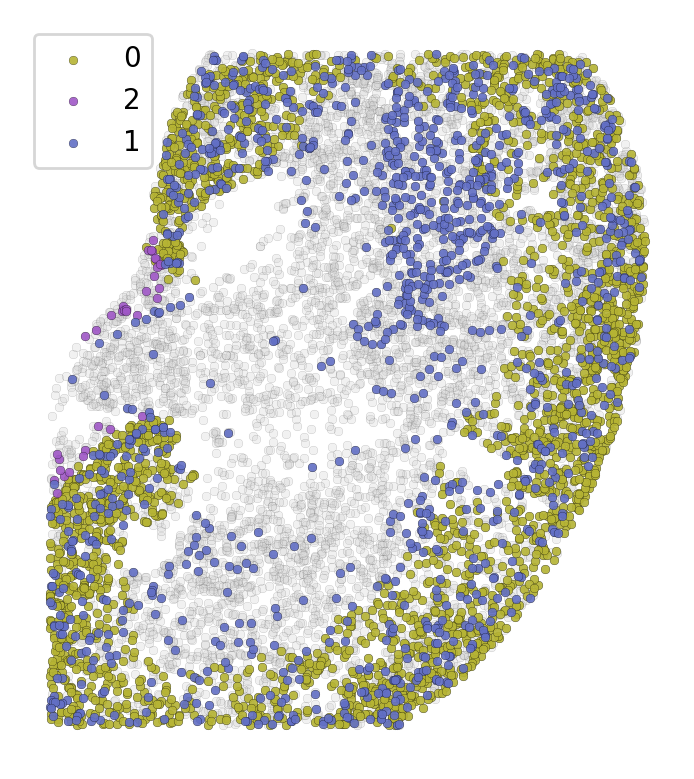

In [126]:
# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), colors)}
color_dict = {
    'null': '#ffffff',
    '1': '#626fc5',
    '0': '#b6b434',
    '2': '#a058c7',
    '3': '#5bb84d',
    '4': '#d050a6',
    '5': "#d44064",
    '6': "#50bca8",
    '7': "#c65d3d",
    '8': "#6b96d2",
    '9': "#d49a46",
    '10': "#bd6c8a",
    '11': "#817531"}

plt.scatter(
    adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
    c='lightgray', s=10, alpha=0.3,
    edgecolor='black', linewidth=0.1
)

for ct in adata_.obs['leiden'].unique():
    mask = adata_.obs['leiden'] == ct
    plt.scatter(
        adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
        c=color_dict[ct], s=10, alpha=0.9, label=ct,
        edgecolor='black', linewidth=0.1
    )
plt.gca().set_axis_off()
plt.gca().set_aspect('equal')
plt.legend()

plt.show()

In [67]:
# # change 0 and 1 clusters so that green is on the outside

# adata_.obs['leiden_v2'] = adata_.obs['leiden'].copy()
# adata_.obs['leiden'] = adata_.obs['leiden'].map(
#     lambda x: '1' if x == '2' else ('2' if x == '1' else x))

# plt.scatter(
#     adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
#     c='lightgray', s=10, alpha=0.3,
#     edgecolor='black', linewidth=0.1
# )
# for ct in adata_.obs['leiden'].unique():
#     mask = adata_.obs['leiden'] == ct
#     plt.scatter(
#         adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
#         c=color_dict[ct], s=10, alpha=0.9, label=ct,
#         edgecolor='black', linewidth=0.1
#     )
# plt.gca().set_axis_off()
# plt.gca().set_aspect('equal')
# plt.legend()

# plt.show()


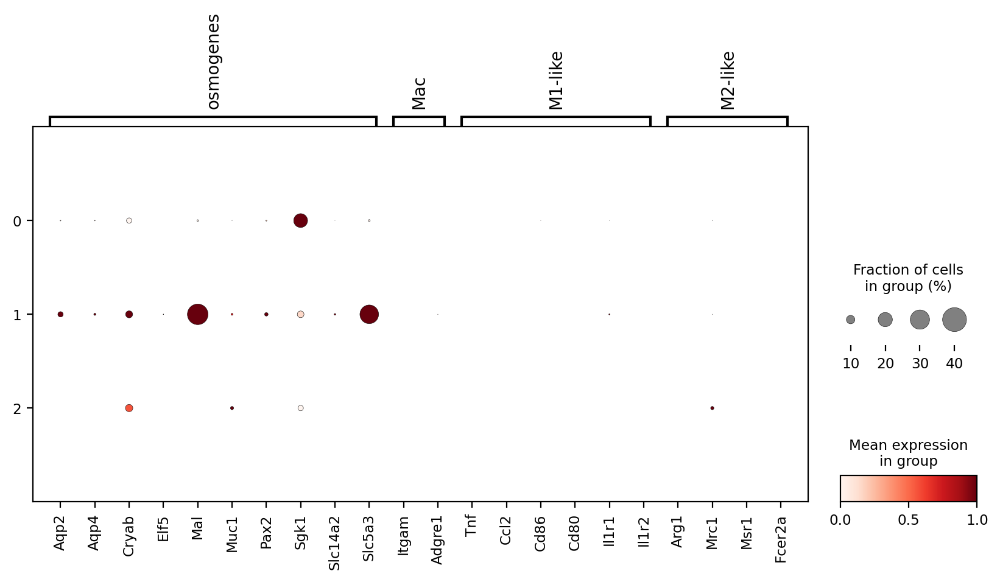

In [127]:
marker_dict = {
    'osmogenes': ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3'],
    'Mac': ['Itgam', 'Adgre1'],
    'M1-like': ["Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2'],
    'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a']
}


marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
sc.pl.dotplot(
    adata_,
    marker_dict,
    # layer='imputed_count', 
    layer='normalized_count',  
    # groupby='banksy_cluster',
    # groupby='ct3',
    groupby='leiden', 
    dendrogram=False,
    standard_scale='var',
    figsize=(10, 4), 
    # title='Macrophage Markers in mouse_kidney_13',
)


In [128]:
# adata_.obs['banksy_cluster'] = adata_.obs['banksy_cluster'].astype(int)

chart_ = Cartography(adata_, color_dict)


In [129]:
import gc 
gc.collect()

45467

In [130]:
# adata_.obs = adata_.obs.drop(columns=['x', 'y'])

In [131]:
# adata_.X = adata_.layers['normalized_count']

# # Score each gene set
# for name, genes in marker_dict.items():
#     sc.tl.score_genes(adata_, gene_list=genes, score_name=name + '_score')

# # Plot each score spatially
# for name in marker_dict:
#     score_col = name + '_score'
#     plt.figure(figsize=(6, 6))
#     plt.scatter(
#         adata_.obsm['X_umap'][:, 0],
#         adata_.obsm['X_umap'][:, 1],
#         c=adata_.obs[score_col],
#         cmap='viridis',  # You can change colormap here
#         s=10, alpha=0.9,
#         edgecolor='none'
#     )
#     plt.title(f'{name} score')
#     plt.gca().set_axis_off()
#     plt.gca().set_aspect('equal')
#     plt.colorbar(label='Score')
#     plt.show()


In [132]:
##  This quiver plot is kinda ugly. Trying something else

# sample = 'mouse_kidney_visiumHD_subsampled_banksy'

# kotarget = 'Mif'
# ax = chart_.plot_umap_quiver(
#     perturb_target=kotarget,
#     grid_scale=1.5,
#     vector_scale=0.5,
#     figsize=(3, 3), 
#     # hue='ref_ct3', 
#     # hue='banksy_cluster',
#     hue='leiden',
#     alpha=0.5,
#     scatter_size=10,
#     betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}', 
#     # betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}/not_batch_corrected',
#     legend_on_loc=False,
# )
# # Add legend at bottom
# ax.legend(
#     bbox_to_anchor=(0.5, 0.0),
#     loc='upper center', ncol=3, 
#     frameon=False, markerscale=1.5,
#     fontsize=6
# )

# # plt.title(f'{sample} {kotarget} Perturbation (Macs only)')
# plt.show()

In [133]:
chart_.adata

AnnData object with n_obs × n_vars = 3933 × 3058
    obs: 'ct3', 'cell_type', 'cell_type_int', 'reference_cell', 'leiden'
    uns: 'cell_type_colors', 'log1p', 'cell_thresholds', 'received_ligands', 'received_ligands_tfl', 'pca', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled', 'X_harmony'
    varm: 'PCs'
    layers: 'corrected_count', 'imputed_count', 'normalized_count', 'raw_count', 'Mif_4n_0x', 'Mif'
    obsp: 'distances', 'connectivities'

In [134]:
chart_.adata.to_df(layer='Mif')

,A1bg,A4galt,Aadac,Aadat,Aak1,Abat,Abca1,Abca13,Abca7,Abca8a,...,Zfyve28,Zfyve9,Zmynd15,Znrf1,Znrf3,Zranb3,Zswim7,Zswim9,Zwilch,ccdc198
Mif_4n_0x,,,,,,,,,,,,,,,,,,,,,
ID_167606,1.021636,0.129222,1.019231,2.102886,0.038920,1.033352,0.028846,0.214521,0.841872,2.079058,...,0.458891,0.672137,1.680365,3.644270,0.046323,0.292864,0.635794,1.146639,0.016532,1.111222
ID_282974,1.237477,0.065966,1.124909,2.928528,0.036374,1.224285,0.029717,0.217471,0.500384,2.184208,...,0.456771,0.546266,1.323473,2.765976,0.032274,0.199667,0.982049,1.163152,0.015034,1.121904
ID_181186,1.213023,0.252015,1.711396,1.844478,0.094741,0.837219,0.058022,0.845990,1.380213,1.641223,...,1.205240,0.348625,1.918226,4.057529,0.070019,0.236945,0.530585,0.934872,0.033103,1.030800
ID_350439,0.900454,0.203476,1.177867,1.275209,0.442997,1.327459,0.024880,0.658898,2.882558,3.215501,...,1.108338,0.405939,2.561784,3.064625,0.145180,0.304220,1.040251,1.598886,0.026546,1.440240
ID_352401,1.071664,0.221668,0.885716,2.080247,0.113749,1.046637,0.053639,0.308007,1.142814,1.493863,...,0.604650,0.312621,1.929020,3.473117,0.060951,0.202549,0.700654,0.946322,0.035943,0.886460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_33301,0.826329,0.291668,0.982486,1.610816,0.219615,1.369061,0.044626,0.378336,2.018834,2.428385,...,0.904622,0.426262,1.702022,3.385272,0.106407,0.295090,0.850183,1.185887,0.030761,0.983672
ID_124032,1.519961,0.175782,1.117901,2.894387,0.078368,1.141668,0.124673,0.226092,0.292099,2.212723,...,0.664123,0.515355,1.173605,2.835438,0.034921,0.158664,0.887664,1.338757,0.026455,1.035537
ID_346143,1.514890,0.167838,1.300456,2.709986,0.065247,0.968240,0.098034,0.332127,0.522947,1.714404,...,0.679622,0.345927,1.381138,3.298761,0.051161,0.151255,0.470751,1.053735,0.047387,0.931113


In [135]:
chart_.adata.to_df(layer='imputed_count')

,A1bg,A4galt,Aadac,Aadat,Aak1,Abat,Abca1,Abca13,Abca7,Abca8a,...,Zfyve28,Zfyve9,Zmynd15,Znrf1,Znrf3,Zranb3,Zswim7,Zswim9,Zwilch,ccdc198
Mif_4n_0x,,,,,,,,,,,,,,,,,,,,,
ID_167606,1.021636,0.129082,1.019248,2.102867,0.038486,1.033340,0.028407,0.214512,0.841923,2.079056,...,0.458902,0.671991,1.680715,3.644107,0.045739,0.292901,0.635767,1.146609,0.016532,1.111222
ID_282974,1.237476,0.065746,1.124925,2.928519,0.035859,1.224270,0.029111,0.217465,0.500497,2.184219,...,0.456770,0.546100,1.323858,2.765779,0.031520,0.199676,0.982031,1.163112,0.015034,1.121904
ID_181186,1.213022,0.251939,1.711405,1.844467,0.094427,0.837208,0.057540,0.845990,1.380319,1.641231,...,1.205254,0.348491,1.918499,4.057453,0.069476,0.236961,0.530558,0.934834,0.033103,1.030800
ID_350439,0.900452,0.202944,1.177889,1.275182,0.442170,1.327430,0.023828,0.658882,2.882858,3.215507,...,1.108321,0.405971,2.562432,3.064243,0.143771,0.304211,1.040217,1.598806,0.026546,1.440240
ID_352401,1.071664,0.221471,0.885728,2.080207,0.113238,1.046625,0.053208,0.307995,1.142844,1.493872,...,0.604687,0.312382,1.929444,3.472937,0.060244,0.202605,0.700636,0.946296,0.035943,0.886460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_33301,0.826328,0.291351,0.982512,1.610781,0.218789,1.369034,0.043710,0.378310,2.019001,2.428382,...,0.904641,0.425858,1.702750,3.384791,0.104990,0.295114,0.850123,1.185831,0.030761,0.983672
ID_124032,1.519961,0.175626,1.117916,2.894384,0.077983,1.141652,0.124163,0.226095,0.292238,2.212744,...,0.664124,0.515051,1.173846,2.835445,0.034390,0.158713,0.887625,1.338736,0.026455,1.035537
ID_346143,1.514889,0.167670,1.300463,2.709985,0.064969,0.968230,0.097784,0.332129,0.523067,1.714406,...,0.679637,0.345764,1.381281,3.298825,0.050767,0.151267,0.470727,1.053716,0.047387,0.931113


In [136]:
delta_X = (chart_.adata.to_df(layer='Mif') - chart_.unperturbed_expression).values
gene_mtx = chart_.unperturbed_expression.values
gene_mtx.shape, delta_X.shape

((3933, 3058), (3933, 3058))

In [137]:
gene_mtx = gene_mtx.astype(np.float64)

In [138]:
delta_X.dtype

dtype('float64')

In [139]:
corr = chart_.compute_perturbation_corr(gene_mtx, delta_X)
corr.shape

(3933, 3933)

In [140]:
delta_X

array([[ 3.50700357e-07,  1.39240402e-04, -1.68581724e-05, ...,
         2.92131116e-05,  0.00000000e+00,  0.00000000e+00],
       [ 1.46739945e-07,  2.20420614e-04, -1.55634427e-05, ...,
         3.97537053e-05,  0.00000000e+00,  0.00000000e+00],
       [ 6.65176136e-07,  7.57659029e-05, -8.28196654e-06, ...,
         3.73207616e-05,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 3.91569008e-07,  1.67778129e-04, -7.39969925e-06, ...,
         1.85952201e-05,  0.00000000e+00,  0.00000000e+00],
       [-2.26266499e-07,  3.18614925e-04, -1.82785154e-05, ...,
         3.87224163e-05,  0.00000000e+00,  0.00000000e+00],
       [ 4.02833823e-07,  1.62481638e-04, -1.53754494e-05, ...,
         1.93827761e-05,  0.00000000e+00,  0.00000000e+00]])

In [141]:
# null_corr = chart_.compute_perturbation_corr(gene_mtx, delta_X * 0)
# null_corr.shape

In [142]:
# P = chart_.compute_transition_probabilities(delta_X, embedding=None, n_neighbors)
# P.shape

In [143]:
# source_ct = '0'
# transition_df0 = chart_.compute_transitions(corr - null_corr, source_ct=source_ct, annot='leiden')
# range_df = chart_.assess_transitions(
#     transition_df0, adata_.obs['leiden'], source_ct, 'leiden')

# range_df 

In [144]:
# np.unique(transition_df0.values)

In [145]:
# ix = 0
# base_celltypes = chart_.adata.obs['leiden']
# fate_df = transition_df0.iloc[ix].to_frame().join(
#                 base_celltypes).groupby('leiden').mean().loc[['0', '1', '2']]
# fate_df

In [146]:
# print(f'source{source_ct} transitions')
# fates0 = chart_.get_cellfate(transition_df0, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')

In [147]:
# source_ct = '1'

# transition_df1 = chart_.compute_transitions(corr, source_ct=source_ct, annot='leiden')
# assess_df = chart_.assess_transitions(
#     transition_df1, adata_.obs['leiden'], source_ct, 'leiden')
# assess_df

In [148]:
# print(f'source{source_ct} transitions')
# fates1 = chart_.get_cellfate(transition_df1, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')

In [149]:
# from numba import jit

# # Cannibalized from CellOracle
# @jit(nopython=True)
# def permute_rows_nsign(A: np.ndarray) -> None:
#     """Permute in place the entries and randomly switch the sign for each row of a matrix independently.
#     """
#     plmi = np.array([+1, -1])
#     for i in range(A.shape[0]):
#         np.random.shuffle(A[i, :])
#         A[i, :] = A[i, :] * np.random.choice(plmi, size=A.shape[1])


In [150]:
# rand_corr = corr.copy()
# permute_rows_nsign(rand_corr)

# source_ct = '0'
# print(f'randomly permuted source {source_ct} transitions')
# transition_df = chart_.compute_transitions(rand_corr, source_ct=source_ct, annot='leiden')
# chart_.assess_transitions(
#     transition_df, adata_.obs['leiden'], source_ct, 'leiden')
# chart_.get_cellfate(transition_df, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')
# print('\n')
# source_ct = '1'
# print(f'randomly permuted source{source_ct} transitions')
# transition_df = chart_.compute_transitions(rand_corr, source_ct=source_ct, annot='leiden')
# chart_.assess_transitions(
#     transition_df, adata_.obs['leiden'], source_ct, 'leiden')
# chart_.get_cellfate(transition_df, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')


### Plot final

In [151]:
import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point

In [179]:
adata = adata_
chart = chart_

In [153]:
# T = 0.05
# P = np.ones((adata.n_obs, adata.n_obs))
# np.fill_diagonal(P, 0)
# P *= np.exp(corr / T)   
# P /= P.sum(1)[:, None]

In [154]:
# transition_df = pd.DataFrame(P)
# transition_df.columns = adata.obs_names

In [155]:
# transitions = chart.get_cellfate(transition_df, allowed_fates=['0', '1', '2'], thresh=0.0002, annot='leiden')
# adata.obs['transition'] = transitions

In [156]:
try:
    del adata.obs['transition']
except:
    pass

In [157]:
try:
    del chart.adata.obs['transition']
except:
    pass

In [158]:
chart.get_transition_annot(
    corr,
    allowed_fates=chart.adata.obs['leiden'].unique(), 
    thresh=0, 
    annot='leiden')

source ct 0 Counter({'0': 2414, '1': 195, '2': 3}) 0.0002522899398298977 0.0
source ct 2 Counter({'0': 33, '1': 2, '2': 1}) 0.0002917243532083835 0.0
source ct 1 Counter({'0': 934, '1': 180, '2': 171}) 0.00026701180441645754 0.0


In [159]:
# chart.color_dict['null'] = '#e3e3e3'

In [160]:
xy = pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=['x', 'y'])

In [161]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='leiden')
ct_points_wt, ct_points_ko

({'0': array([[3498.8512359 , 2350.63544955],
         [1858.72425686, 4003.68608274],
         [3434.08110812, 2344.17005417],
         ...,
         [3534.46837013, 4519.09800851],
         [3195.23181309,  679.24550961],
         [3740.34511177, 2077.52622863]]),
  '2': array([[1046.14950452, 2875.78218132],
         [1428.6399079 , 3076.77737187],
         [1333.53494247, 2338.72251251],
         [1215.35381899, 3005.9890982 ],
         [ 817.80814323, 2071.015407  ],
         [1135.88309886, 2260.73353889],
         [1450.62927264, 3281.91459186],
         [1375.55844765, 3375.50671957],
         [1420.9304942 , 3318.39527031],
         [1062.32450045, 2278.28209718],
         [1431.00580655, 3268.8841214 ],
         [ 980.00072372, 2127.00170163],
         [1213.44274222, 2992.10844649],
         [ 852.95856539, 1966.37492319],
         [1397.81875102, 3367.04506684],
         [1362.17191203, 3117.38441246],
         [ 824.06542118, 2005.37003552],
         [1400.71172465, 3434.5

In [162]:
test_adata.obs['x'] = test_adata.obsm['spatial'][:, 0]
test_adata.obs['y'] = test_adata.obsm['spatial'][:, 1]

In [188]:
alpha_shape_0 = alphashape.alphashape(ct_points_wt['0'], alpha=0.005)
alpha_shape_1 = alphashape.alphashape(ct_points_wt['1'], alpha=0.005)
alpha_shape_2 = alphashape.alphashape(ct_points_wt['2'], alpha=0.005)

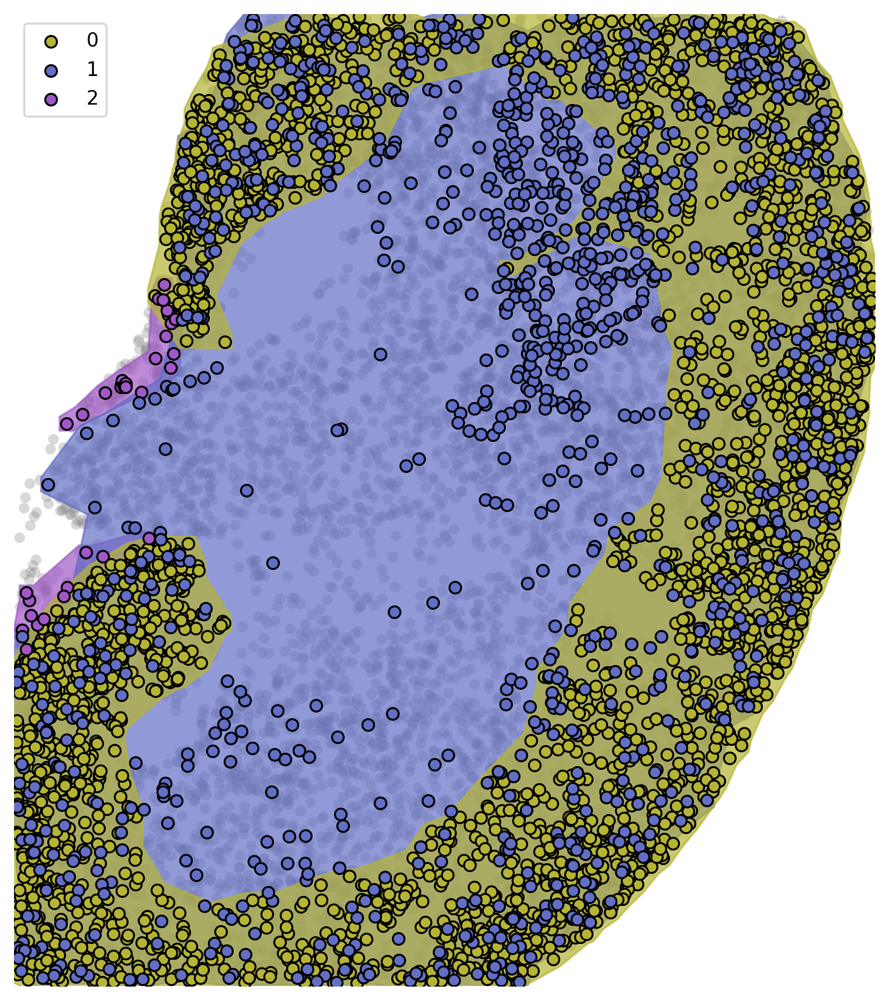

In [189]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400


try:    
    for geom in alpha_shape_2.geoms:
        if geom.area > area_thresh:
            ax.fill(
                geom.exterior.xy[0], 
                geom.exterior.xy[1], 
                color=chart_.color_dict['2'], alpha=zone_alpha)
except:
    geom = alpha_shape_2
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=chart_.color_dict['2'], alpha=zone_alpha)

try:
    for geom in alpha_shape_1.geoms:
        if geom.area > area_thresh:
            ax.fill(
                geom.exterior.xy[0], 
                geom.exterior.xy[1], 
                color=chart_.color_dict['1'], alpha=zone_alpha)
except:
    geom = alpha_shape_1
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=chart_.color_dict['1'], alpha=zone_alpha)

try:
    for geom in alpha_shape_0.geoms:
        if geom.area > area_thresh:
            ax.fill(
                geom.exterior.xy[0], 
                geom.exterior.xy[1], 
                color=chart_.color_dict['0'], alpha=zone_alpha)
except:
    geom = alpha_shape_0
    if geom.area > area_thresh:
        ax.fill(
                geom.exterior.xy[0], 
                geom.exterior.xy[1], 
                color=chart_.color_dict['0'], alpha=zone_alpha)
        
for ct in adata.obs['leiden'].unique():
    ax.scatter(
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 1],
        c=chart_.color_dict[ct], alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: int(x[1]))
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_preKO.svg', format='svg')

In [165]:
ct_points_ko.keys()

dict_keys(['0', '1', '2'])

In [186]:
alphashapes = {}
for l in ['2', '1', '0']:
    alphashapes[l] = alphashape.alphashape(ct_points_ko[l], alpha=0.005)


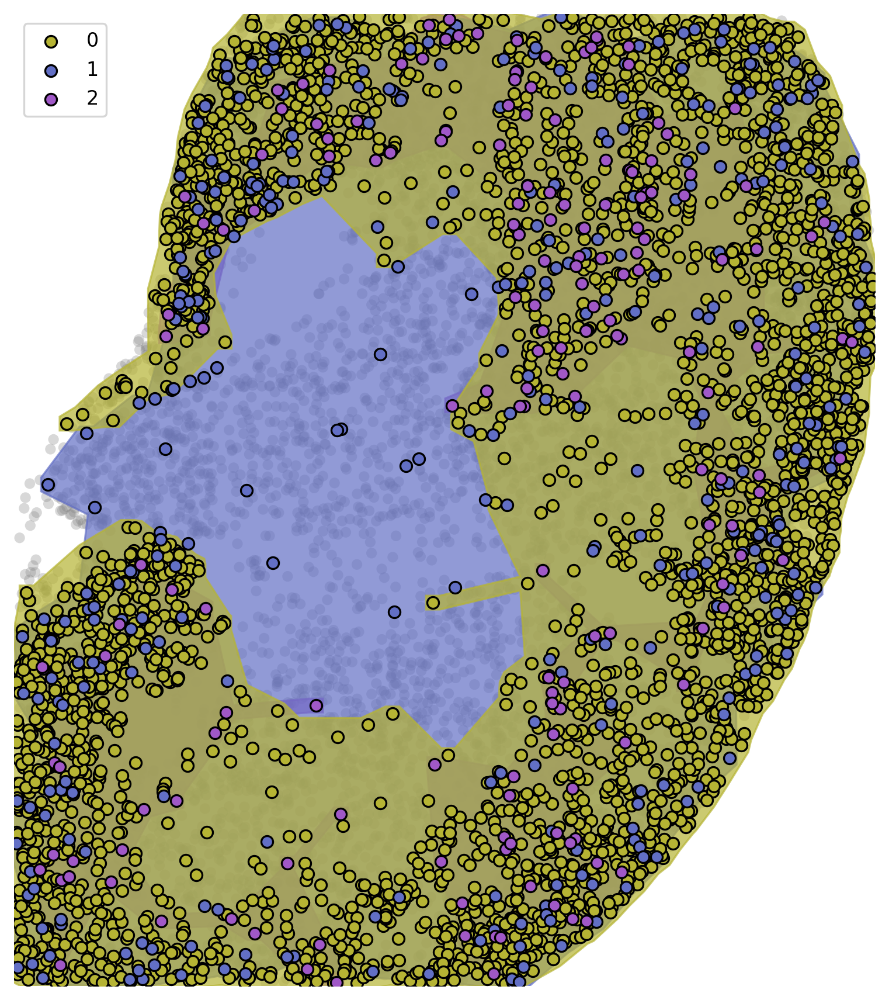

In [187]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for cluster, alpha_shape in alphashapes.items():
    try:
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    except:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in adata.obs['transition'].unique():
    ax.scatter(
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=chart_.color_dict.get(ct,'gray'), alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: x[1])
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_postKO.svg', format='svg')

In [168]:
genes = ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3',
        "Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2',
        'Arg1', 'Mrc1', 'Msr1', 'Fcer2a']

df = adata[:,genes].to_df(layer='normalized_count')
df['leiden'] = adata.obs['leiden'].astype('category')
df.to_csv('figures/dfs/mouse_kidney_visium_leiden_markers.csv')

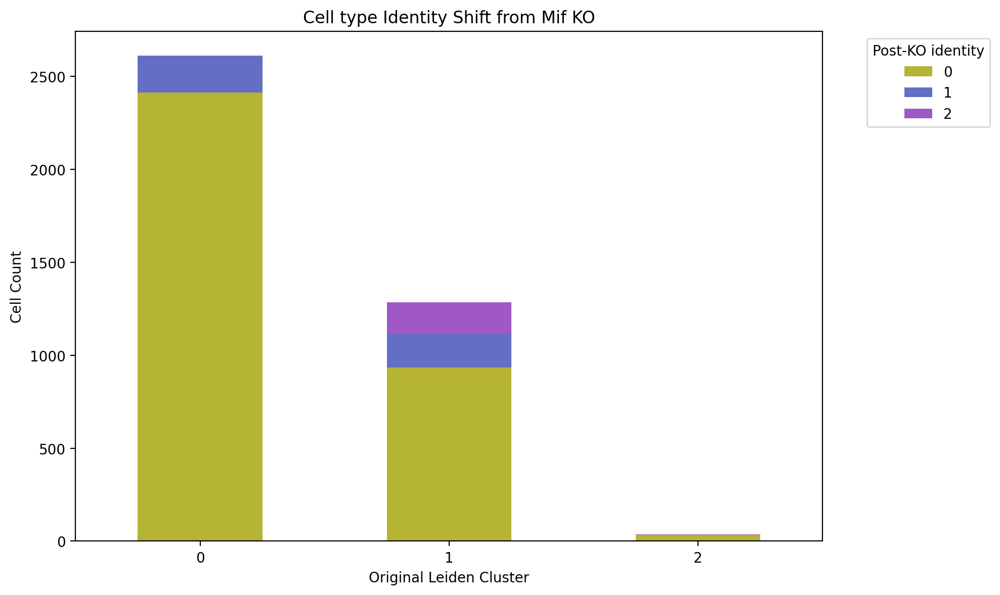

In [169]:
import pandas as pd
import matplotlib.pyplot as plt

df = adata.obs[['leiden', 'transition']].copy()
df['leiden'] = pd.Categorical(df['leiden'], ordered=True, categories=sorted(df['leiden'].unique(), key=lambda x: int(x)))
counts = df.groupby(['leiden', 'transition']).size().unstack(fill_value=0)

counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=[chart_.color_dict[label] for label in counts.columns])
plt.xlabel('Original Leiden Cluster')
plt.ylabel('Cell Count')
plt.title('Cell type Identity Shift from Mif KO')

plt.xticks(rotation=0)

plt.legend(title='Post-KO identity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [170]:
# plt.figure(figsize=(3,3), dpi=120)

# sns.heatmap(
#     counts,
#     annot=True,
#     fmt='d',  # integer formatting
#     cmap='Blues',  # nice clean color palette
#     linewidths=0.5,
#     linecolor='white', 
#     cbar=False,
#     square=True,
#     annot_kws={"size": 6}
# )

# plt.title("Transitions between Leiden Clusters from Mif KO", fontsize=8)
# plt.xlabel("Transition Label", fontsize=6)
# plt.ylabel("Original", fontsize=6)
# plt.xticks(rotation=0, ha='right', fontsize=6)
# plt.yticks(rotation=0, fontsize=6)

# plt.savefig('figures/mouse_kidney_visium_MifKO_transitions.svg', format='svg')
# plt.tight_layout()
# plt.show()


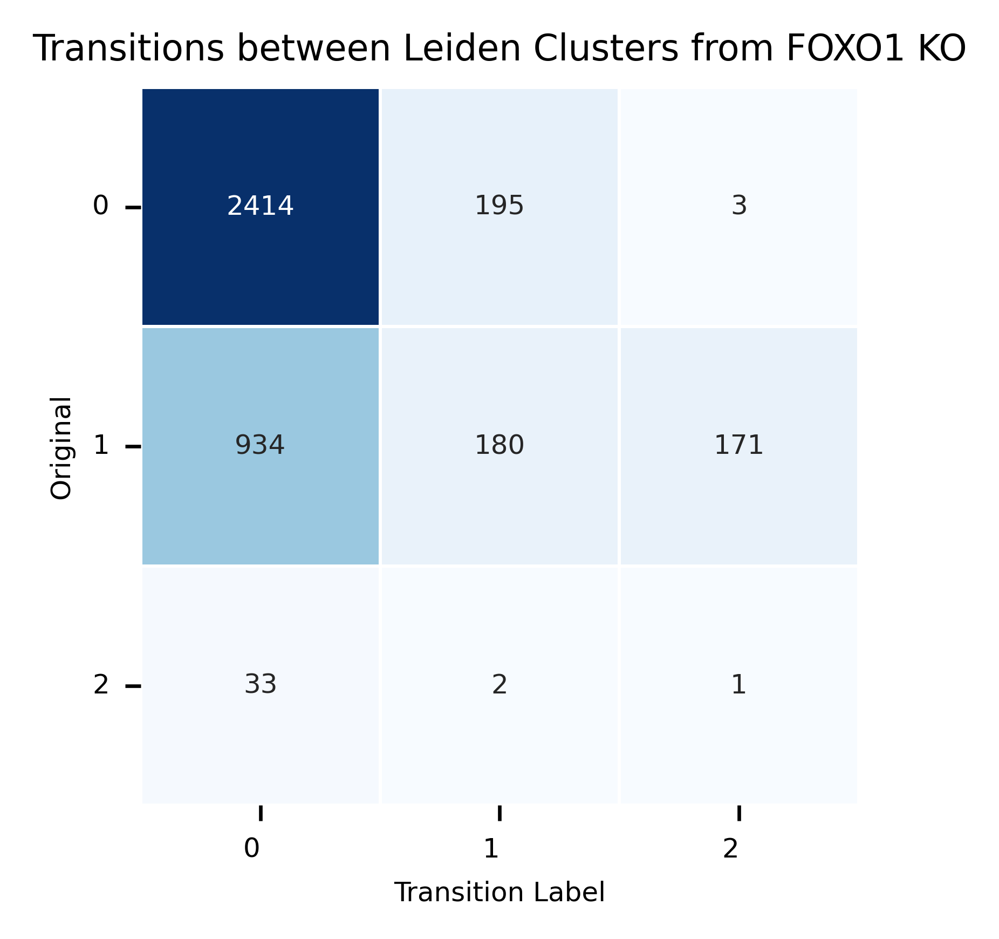

In [171]:
plt.figure(figsize=(3,3), dpi=300)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  # integer formatting
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between Leiden Clusters from FOXO1 KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions.svg', format='svg')
plt.tight_layout()
plt.show()


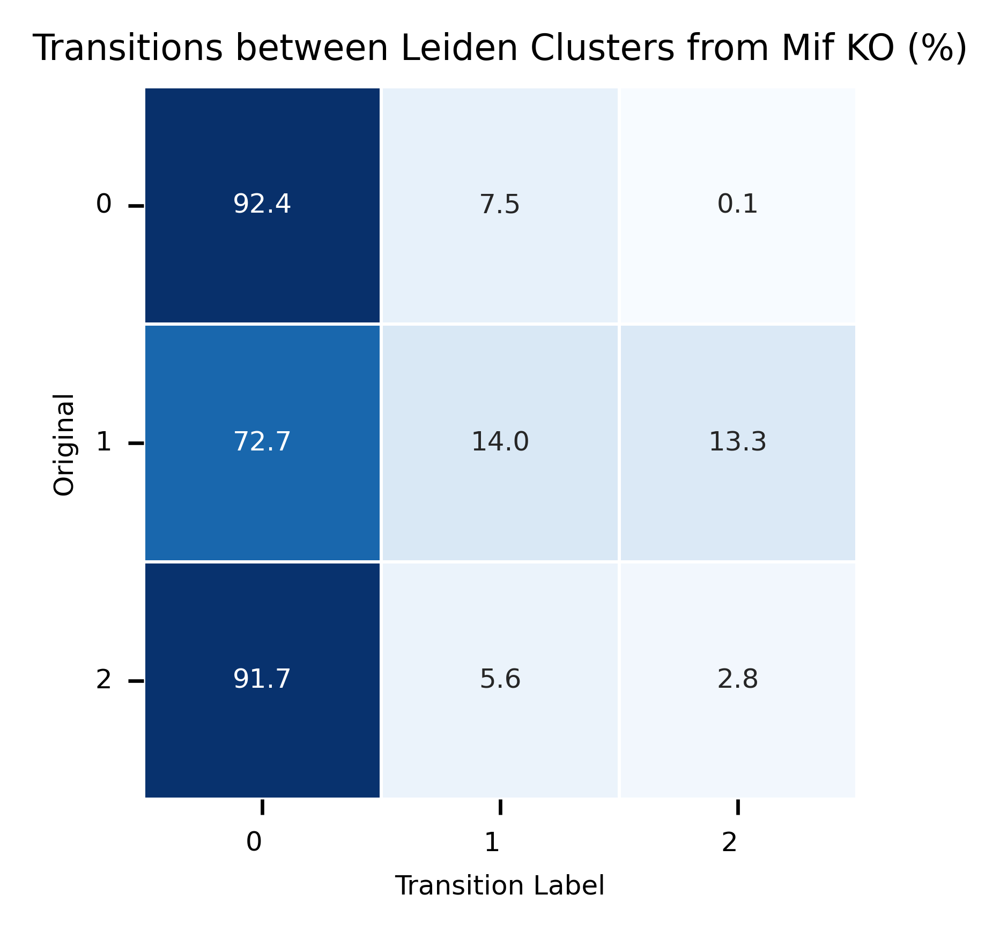

In [172]:
plt.figure(figsize=(3,3), dpi=300)

# Normalize counts by row (cluster)
counts_pct = counts.div(counts.sum(axis=1), axis=0) * 100

sns.heatmap(
    counts_pct,
    annot=True,
    fmt='.1f',  # float formatting with 1 decimal place
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between Leiden Clusters from Mif KO (%)", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions_pct.svg', format='svg')
plt.tight_layout()
plt.show()

In [173]:
# # Custom handler for wedge pairs in legend
# class WedgePairHandler:
#     def __init__(self, rotation=0):
#         self.rotation = rotation
        
#     def legend_artist(self, legend, orig_handle, fontsize, handlebox):
#         x0, y0 = handlebox.xdescent, handlebox.ydescent
#         width, height = handlebox.width, handlebox.height
#         r = min(width, height) * 1
#         center = (x0 + width/2, y0 + height/2)
        
#         # Create left and right wedges with rotation
#         wedge1 = matplotlib.patches.Wedge(
#             center=center,
#             r=r,
#             theta1=90 + self.rotation, theta2=270 + self.rotation,
#             facecolor=orig_handle[0].get_facecolor(),
#             edgecolor='black',
#             linewidth=0.25,
#             transform=handlebox.get_transform()
#         )
        
#         wedge2 = matplotlib.patches.Wedge(
#             center=center,
#             r=r,
#             theta1=-90 + self.rotation, theta2=90 + self.rotation,
#             facecolor=orig_handle[1].get_facecolor(),
#             edgecolor='black', 
#             linewidth=0.25,
#             transform=handlebox.get_transform()
#         )
        
#         handlebox.add_artist(wedge1)
#         handlebox.add_artist(wedge2)
#         return [wedge1, wedge2]

# fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
# data = xy.join(adata.obs)
# source_data = data[data.leiden == source_ct]
# transition_data = data.loc[source_cells]

# scatter = sns.scatterplot(
#     # data=xy.join(adata.obs),
#     data = test_adata.obs,
#     x='x', y='y',
#     # hue='banksy_celltypes', 
#     color='grey',
#     s=30,
#     alpha=0.3,
#     edgecolor='none',
#     # palette=color_dict,
#     ax=ax,
# )

# zone_alpha = 0.85
# area_thresh = 400

# for geom in alpha_shape_1.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['1'], alpha=zone_alpha)
        
# for geom in alpha_shape_0.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['0'], alpha=zone_alpha)
    
# for geom in alpha_shape_2.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['2'], alpha=zone_alpha)

# exclude_points = set()
# alpha_shape_4 = alpha_shape_0.intersection(alpha_shape_1)

# for geom in alpha_shape_4.geoms:
#      for idx, row in xy.iterrows(): 
#         point = row[['x', 'y']].values 
#         if geom.contains(Point(point)):  
#             exclude_points.update({idx}) 


# radius = 250
# for idx, row in data.iterrows():

#     # do not plot if they are in overlapping boundaries
#     if row.leiden == '1' and idx in exclude_points:
#         continue

#     if idx in source_cells:
#         angle = 0
#         circle1 = matplotlib.patches.Wedge((row.x, row.y), radius, 90+angle, 270+angle,
#                                          facecolor=color_dict[row.leiden],
#                                          alpha=1,
#                                          edgecolor='black', linewidth=0.25)
#         circle2 = matplotlib.patches.Wedge((row.x, row.y), radius, -90+angle, 90+angle,
#                                          facecolor=color_dict[row.transition],
#                                          alpha=1,
#                                          edgecolor='black', linewidth=0.25)
#         ax.add_patch(circle1)
#         ax.add_patch(circle2)


# # Collect all unique transition types from transition_data
# unique_transitions = transition_data['transition'].unique()

# # Create legend elements for each transition type
# legend_elements = []
# labels = []

# # for transition in ['0', '1', '2']:
# for transition, source_ct in [('0', '0'), ('1', '1'), ('1', '0'), ('0', '1')]:
#     # Count number of transitions for this type
#     if source_ct == '1':
#         tmp = transition_data[(transition_data['transition'] == transition) & (transition_data['leiden'] == source_ct)]
#         tmp = tmp[~tmp.index.isin(exclude_points)]
#         n_transitions = len(tmp)
#     else:
#         n_transitions = len(transition_data[(transition_data['transition'] == transition) & (transition_data['leiden'] == source_ct)])
    
#     wedge_source = matplotlib.patches.Wedge((0,0), radius, 0, 0,
#                                         facecolor=color_dict[source_ct])
#     wedge_transition = matplotlib.patches.Wedge((0,0), radius, 0, 0,
#                                             facecolor=color_dict[transition])
#     legend_elements.append((wedge_source, wedge_transition))
#     labels.append(f"{source_ct} → {transition} (n={n_transitions})")

# transition_legend = ax.legend(legend_elements, labels, 
#                             handler_map={tuple: WedgePairHandler(rotation=0)},
#                             bbox_to_anchor=(1.1, 0.6), 
#                             # loc='center right', 
#                             borderaxespad=0.,
#                             fontsize=15,
#                             markerscale=5,
#                             labelspacing=3,
#                             handletextpad=1.5, 
#                             frameon=False,
#                             title="")

# ax.set_frame_on(False)
# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_xlabel('')
# ax.set_ylabel('')
# ax.set_aspect('equal')
# ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
# ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

# plt.savefig(f'figures/mouse_kidney_visium_MifKO.png')

### Non-mac cells

In [190]:
adata = renata.adata.copy()
adata

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'ct3', 'cell_type', 'cell_type_int', 'reference_cell'
    uns: 'cell_type_colors', 'log1p', 'cell_thresholds', 'received_ligands', 'received_ligands_tfl'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled', 'X_harmony'
    layers: 'corrected_count', 'imputed_count', 'normalized_count', 'raw_count', 'Mif_4n_0x', 'Mif'

In [191]:
adata_ = adata[(adata.obs['cell_type'] != 'Myeloid')]
adata_.obs['cell_type'].value_counts()

cell_type
Endothelial            2165
Epithelial             1090
Mesenchymal_Stromal     617
B                       555
T                       145
NK                       24
Name: count, dtype: int64

In [192]:
adata.obs['cell_type'].value_counts()

cell_type
Myeloid                5404
Endothelial            2165
Epithelial             1090
Mesenchymal_Stromal     617
B                       555
T                       145
NK                       24
Name: count, dtype: int64

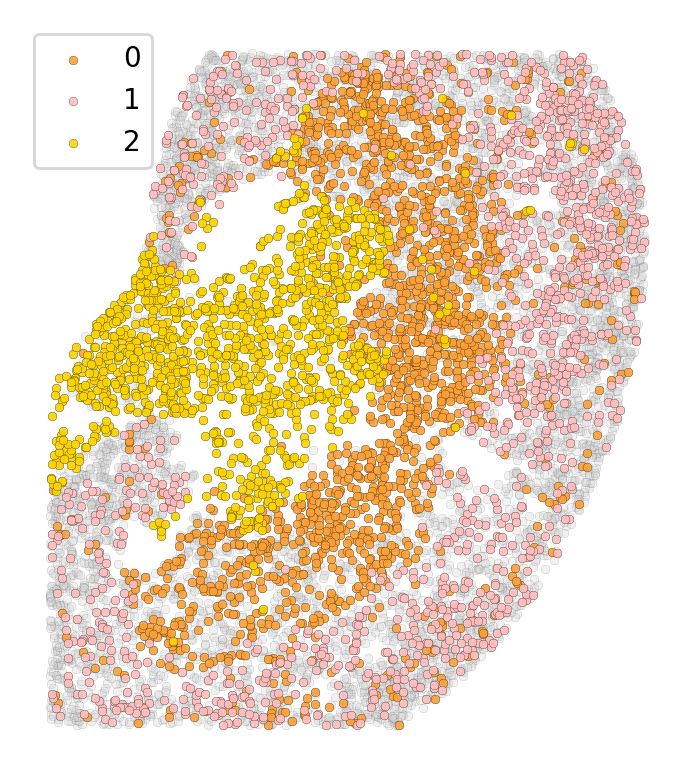

In [208]:
# sc.pp.neighbors(adata_, use_rep='X_umap')
sc.pp.neighbors(adata_, use_rep='X_harmony')
sc.tl.leiden(adata_, key_added='leiden', resolution=0.2)

# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), colors[::-1])}
color_dict = {
    '1': '#ffbdbd',
    '0': '#fca138',
    '2': '#fcd400',
    '-1': '#ffffff'}

plt.scatter(
    adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
    c='lightgray', s=10, alpha=0.3,
    edgecolor='black', linewidth=0.1
)
for ct in adata_.obs['leiden'].unique():
    mask = adata_.obs['leiden'] == ct
    plt.scatter(
        adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
        c=color_dict[ct], s=10, alpha=0.9, label=ct,
        edgecolor='black', linewidth=0.1
    )
plt.gca().set_axis_off()
plt.gca().set_aspect('equal')
plt.legend()

plt.show()


In [209]:
adata_.obs['leiden_v2'] = adata_.obs['leiden'].copy()
adata_.obs['leiden'] = adata_.obs['leiden'].map({
    '0': '1', '1': 0, '2': '2'
})

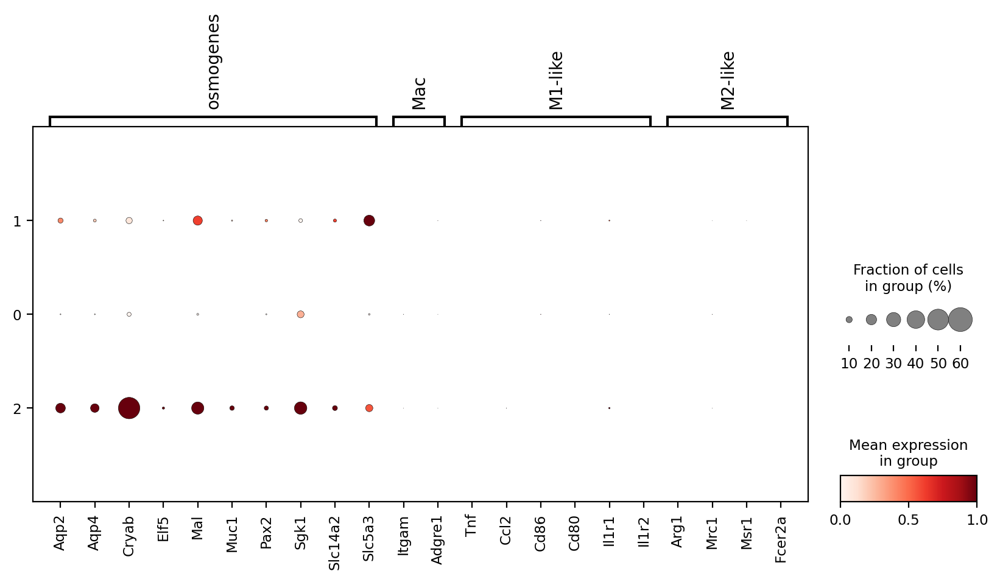

In [210]:
marker_dict = {
    'osmogenes': ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3'],
    'Mac': ['Itgam', 'Adgre1'],
    'M1-like': ["Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2'],
    'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a']
}


marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
sc.pl.dotplot(
    adata_,
    marker_dict,
    # layer='imputed_count', 
    layer='normalized_count',  
    # groupby='banksy_cluster',
    # groupby='ct3',
    groupby='leiden', 
    dendrogram=False,
    standard_scale='var',
    figsize=(10, 4), 
    # title='Macrophage Markers in mouse_kidney_13',
)


In [211]:
# adata_.obs['banksy_cluster'] = adata_.obs['banksy_cluster'].astype(int)

chart_ = Cartography(adata_, color_dict)


In [212]:
delta_X = (chart_.adata.to_df(layer='Mif') - chart_.unperturbed_expression).values
gene_mtx = chart_.unperturbed_expression.values
gene_mtx.shape, delta_X.shape

((4596, 3058), (4596, 3058))

In [213]:
gene_mtx = gene_mtx.astype(np.float64)

In [214]:
corr = chart_.compute_perturbation_corr(gene_mtx, delta_X, embedding=chart_.adata.obsm['X_harmony'], k=900)
corr.shape

(4596, 4596)

In [215]:
## PLOT

import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point

In [216]:
adata = adata_
chart = chart_

In [219]:
adata.obs['leiden'] = adata.obs['leiden'].astype(str)
adata.obs['leiden'].value_counts()

leiden
1    1908
0    1412
2    1276
Name: count, dtype: int64

In [220]:
chart.get_transition_annot(
    corr, 
    allowed_fates=['0', '1', '2'], 
    thresh=0, 
    annot='leiden'
)

source ct 1 Counter({'1': 1414, '2': 442, '0': 52}) 0.00025648713483090394 0.0
source ct 0 Counter({'0': 1198, '2': 141, '1': 73}) 0.0001528829156331643 0.0
source ct 2 Counter({'2': 1227, '0': 31, '1': 18}) 0.0002003605610902664 0.0


In [221]:
xy = pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=['x', 'y'])

In [222]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='leiden')

In [223]:
ref_adata.obs['x'] = ref_adata.obsm['spatial'][:, 0]
ref_adata.obs['y'] = ref_adata.obsm['spatial'][:, 1]

In [224]:
alphashapes = {}
for l in ['2', '1', '0']:
    alphashapes[l] = alphashape.alphashape(ct_points_wt[l], alpha=0.005)

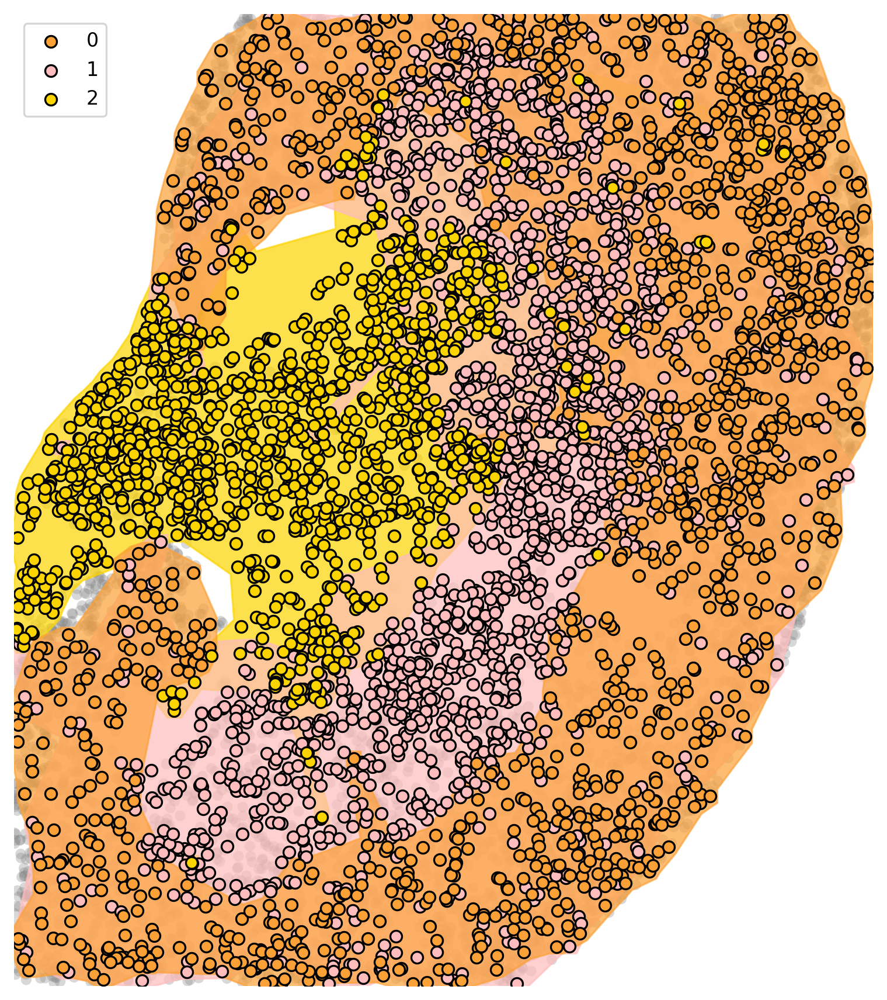

In [225]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for cluster, alpha_shape in alphashapes.items():
    try:
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    except:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in adata.obs['leiden'].unique():
    ax.scatter(
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: int(x[1]))
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_preKO_nonMyeloid.svg', format='svg')

In [226]:
alphashapes = {}
for l in ['2', '1', '0']:
    alphashapes[l] = alphashape.alphashape(ct_points_ko[l], alpha=0.005)

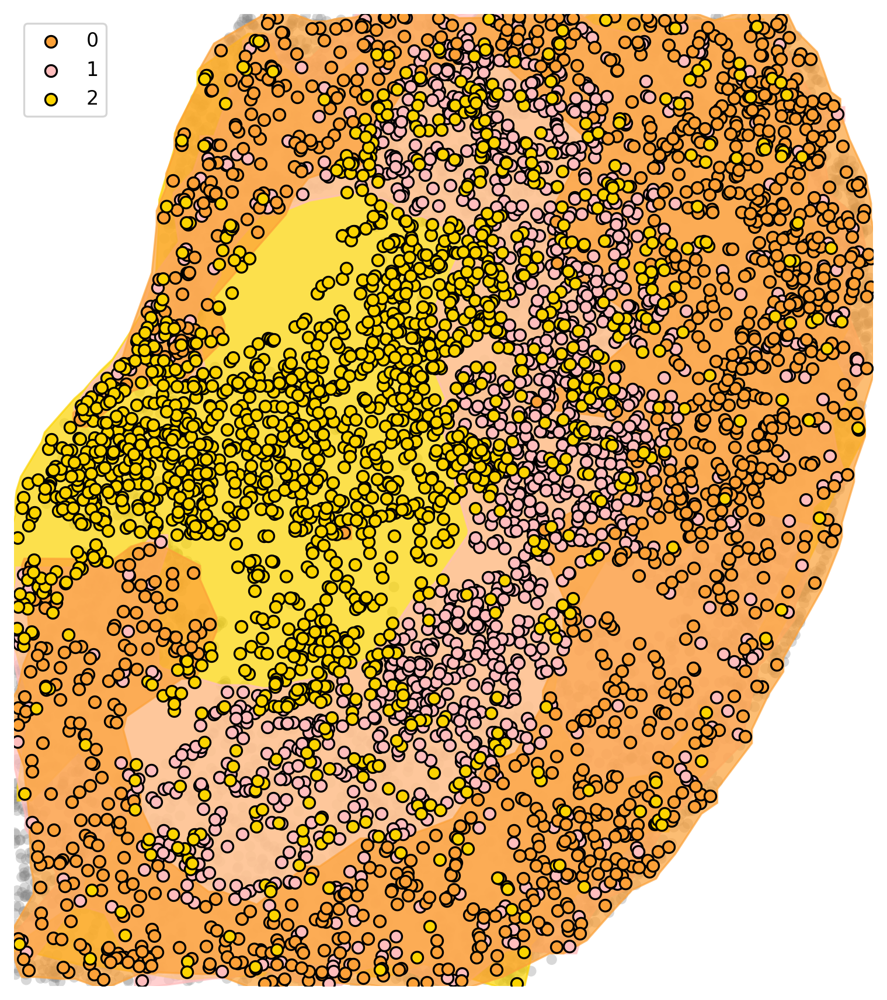

In [227]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for cluster, alpha_shape in alphashapes.items():
    try:
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    except:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in adata.obs['transition'].unique():
    ax.scatter(
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=chart_.color_dict.get(ct,'gray'), alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: x[1])
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_postKO_nonMyeloid.svg', format='svg')

In [230]:
df = adata.obs[['leiden', 'transition']].copy()
df['leiden'] = pd.Categorical(df['leiden'], ordered=True, categories=sorted(df['leiden'].unique(), key=lambda x: int(x)))
counts = df.groupby(['leiden', 'transition']).size().unstack(fill_value=0)


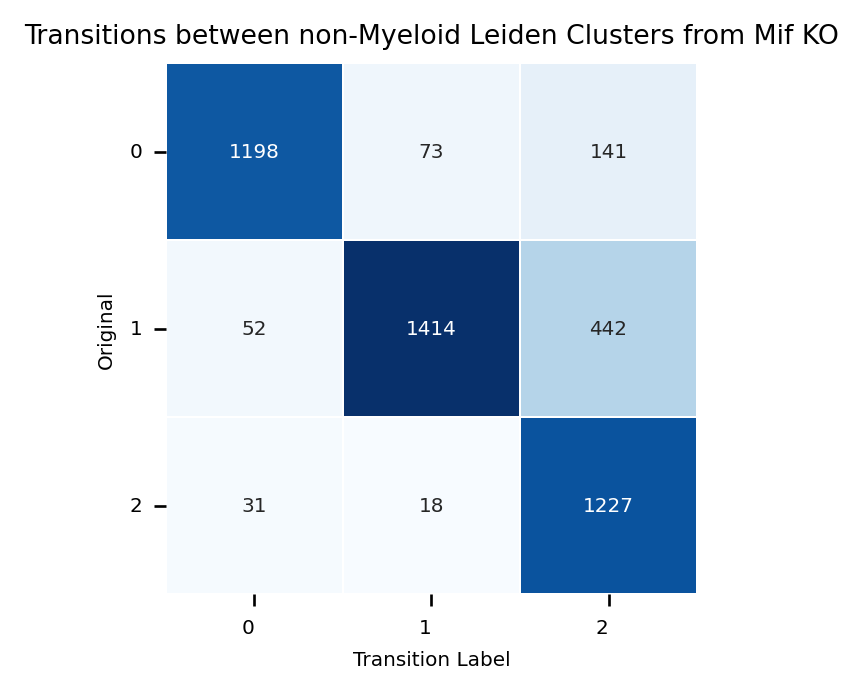

In [231]:
plt.figure(figsize=(3,3), dpi=120)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  # integer formatting
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between non-Myeloid Leiden Clusters from Mif KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions_nonMyeloid.svg', format='svg')
plt.tight_layout()
plt.show()


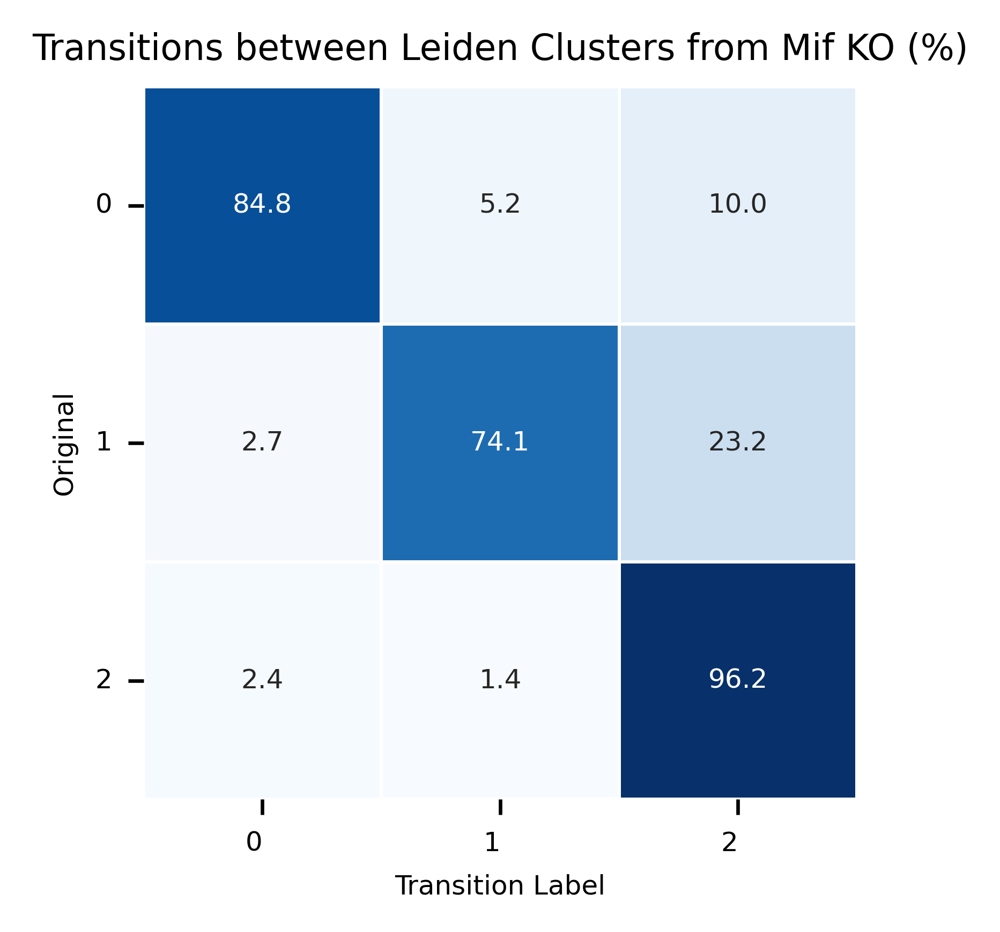

In [232]:
plt.figure(figsize=(3,3), dpi=300)

# Normalize counts by row (cluster)
counts_pct = counts.div(counts.sum(axis=1), axis=0) * 100

sns.heatmap(
    counts_pct,
    annot=True,
    fmt='.1f',  # float formatting with 1 decimal place
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between Leiden Clusters from Mif KO (%)", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions_nonMyeloid_pct.svg', format='svg')
plt.tight_layout()
plt.show()